In [7]:
import pandas as pd
import numpy as np
import sys
import math
import seaborn as sns
from matplotlib import pyplot as plt
import umap.umap_ as umap
import scipy.stats as stats
from tribus import run_tribus, heatmap_for_median_expression, marker_expression, umap_vis, z_score, cell_type_distribution
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import confusion_matrix
from sklearn.metrics import rand_score, accuracy_score, precision_score, f1_score, adjusted_rand_score

In [22]:
# if save session
import dill
dill.dump_session('stellar_notebook_new_env.db')

In [2]:
# restore session
import dill
dill.load_session('stellar_notebook_new_env.db')

## Analysis on B004 colon region

For the B004_training_dryad.csv dataset, data from donor B004 was expert annotated for cell types within the small intestine and colon (~250,000 cells) and contains cell type labels in addition to protein marker expressions and x, y positions. Each donor has 4 regions from the colon and 4 regions from the small intestine. 

Subsequently images underwent standard CODEX image processing (tile stitching, drift compensation, cycle concatenation, background subtraction, deconvolution, and determination of best focal plane), single cell segmentation, and column marker z-normalization by tissue. 

In [2]:
sample_data = pd.read_csv('C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel_CL.csv',low_memory=False)
sample_data.columns

Index(['...1', 'MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f', 'CD15',
       'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR', 'CD8',
       'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38', 'CD90', 'aSMA',
       'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68', 'CD34', 'aDef5',
       'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin', 'CK7', 'CD117', 'CD19',
       'Podoplanin', 'CD45', 'CD56', 'CD69', 'Ki67', 'CD49a', 'CD163', 'CD161',
       'x', 'y', 'tissue', 'cell_type_A', 'donor', 'unique_region',
       'cell_type_upperlevel'],
      dtype='object')

### Run Tribus

In [8]:
# read input files
sample_data = pd.read_csv('C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel_CL.csv',low_memory=False)
df = pd.ExcelFile("C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\stellar_logic_gate_cl.xlsx")
logic = pd.read_excel(df, df.sheet_names, index_col=0)

<Axes: >

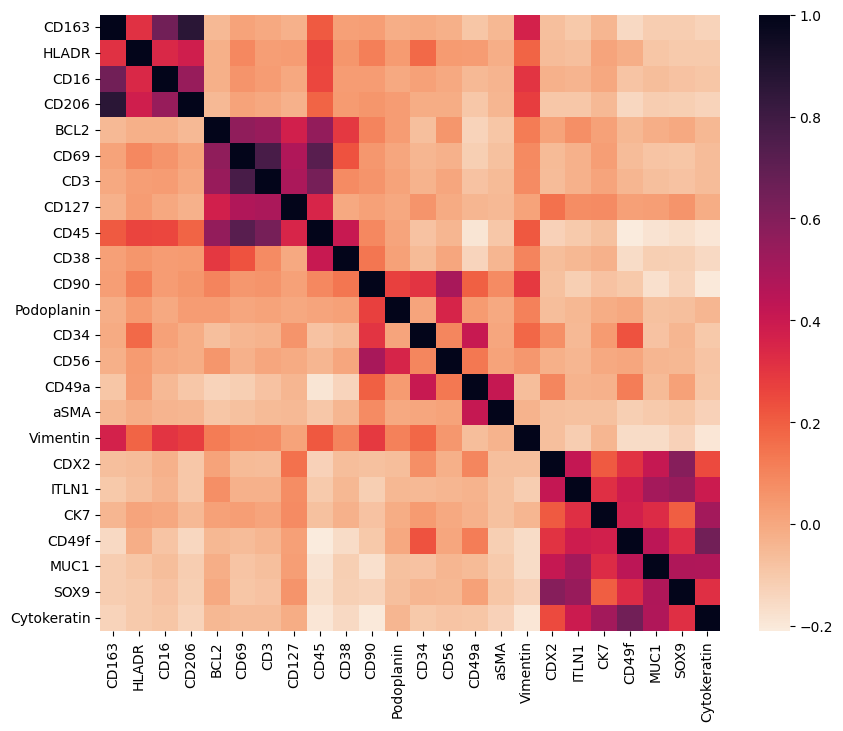

In [151]:
# check the marker correlation matrix we choose for the clustering method
marker_df = sample_data[logic["Global"].index]
plt.figure(figsize=(10,8))
sns.heatmap(marker_df.corr(),cmap=sns.cm.rocket_r)

In [152]:
logic

{'Global':              Myeloid  Lymphoid  Stromal  Epithelial
 Marker                                             
 CD163              1        -1       -1          -1
 HLADR              1        -1       -1          -1
 CD16               1         0       -1          -1
 CD206              1        -1       -1          -1
 BCL2              -1         1       -1          -1
 CD69               0         1       -1          -1
 CD3                0         1       -1          -1
 CD127             -1         1       -1          -1
 CD45               1         1       -1          -1
 CD38               0         1        0          -1
 CD90               0         0        1           0
 Podoplanin        -1         0        1           0
 CD34              -1        -1        1           0
 CD56              -1        -1        1           0
 CD49a             -1        -1        1          -1
 aSMA              -1        -1        1          -1
 Vimentin          -1        -1     

Global, subsetting done
Myeloid, subsetting done
Lymphoid, subsetting done
Stromal, subsetting done
Epithelial, subsetting done
4.280066005388895 minutes


<Axes: xlabel='Cell_type'>

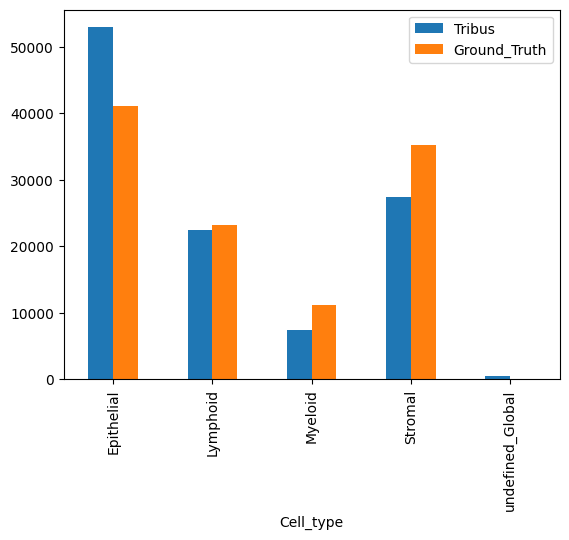

In [153]:
# Run Tribus on z-scored dataset
# MAX_PERCENTILE = 99
# REQUIRED_CELLS_FOR_CLUSTERING = 5000
# THRESHOLD_LOW = 0.001
depth = 2
labels, scores = run_tribus(sample_data, logic, depth=depth, normalization=z_score) # modify depth

# cell_type_distribution(labels, level="Global")
Tribus_stat = pd.DataFrame(np.array(np.unique(list(labels["Global"]), return_counts=True)).T, columns=("Cell_type", "Tribus"))
Truth_stat = pd.DataFrame(np.array(np.unique(list(sample_data["cell_type_upperlevel"]), return_counts=True)).T, columns=("Cell_type", "Ground_Truth"))
Stat_merged = pd.merge(Tribus_stat, Truth_stat, how="outer", on=["Cell_type"])
Stat_merged["Tribus"] = pd.to_numeric(Stat_merged["Tribus"])
Stat_merged["Ground_Truth"] = pd.to_numeric(Stat_merged["Ground_Truth"])

Stat_merged.plot(x="Cell_type",
        kind='bar',
        stacked=False)

### Check Tribus result

<Axes: xlabel='Cell_type'>

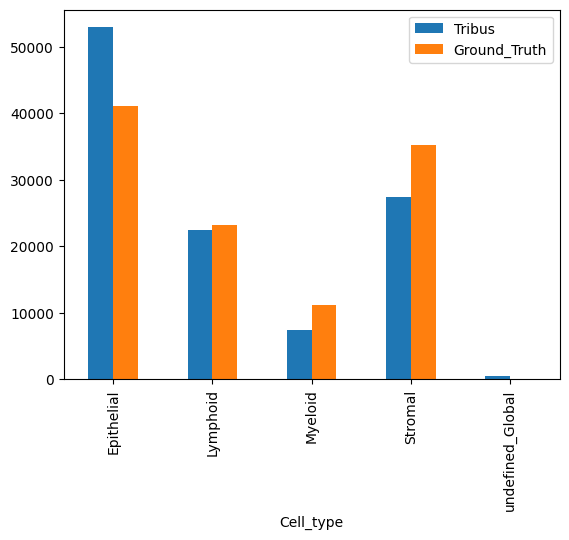

<Figure size 2000x600 with 0 Axes>

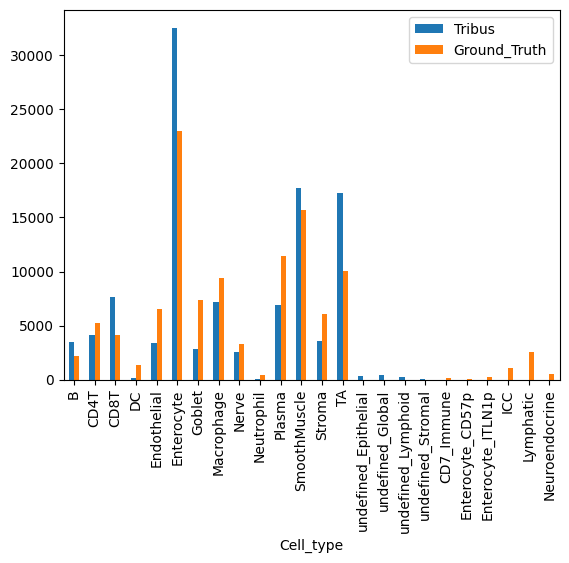

In [154]:
# cell_type_distribution(labels, level="Global")
Tribus_stat = pd.DataFrame(np.array(np.unique(list(labels["Global"]), return_counts=True)).T, columns=("Cell_type", "Tribus"))
Truth_stat = pd.DataFrame(np.array(np.unique(list(sample_data["cell_type_upperlevel"]), return_counts=True)).T, columns=("Cell_type", "Ground_Truth"))
Stat_merged = pd.merge(Tribus_stat, Truth_stat, how="outer", on=["Cell_type"])
Stat_merged["Tribus"] = pd.to_numeric(Stat_merged["Tribus"])
Stat_merged["Ground_Truth"] = pd.to_numeric(Stat_merged["Ground_Truth"])

Stat_merged.plot(x="Cell_type",
        kind='bar',
        stacked=False)

Tribus_stat = pd.DataFrame(np.array(np.unique(list(labels["final_label"]), return_counts=True)).T, columns=("Cell_type", "Tribus"))
Truth_stat = pd.DataFrame(np.array(np.unique(list(sample_data["cell_type_A"]), return_counts=True)).T, columns=("Cell_type", "Ground_Truth"))
Stat_merged = pd.merge(Tribus_stat, Truth_stat, how="outer", on=["Cell_type"])
Stat_merged["Tribus"] = pd.to_numeric(Stat_merged["Tribus"])
Stat_merged["Ground_Truth"] = pd.to_numeric(Stat_merged["Ground_Truth"])

plt.figure(figsize=(20,6))
Stat_merged.plot(x="Cell_type",
        kind='bar',
        stacked=False)

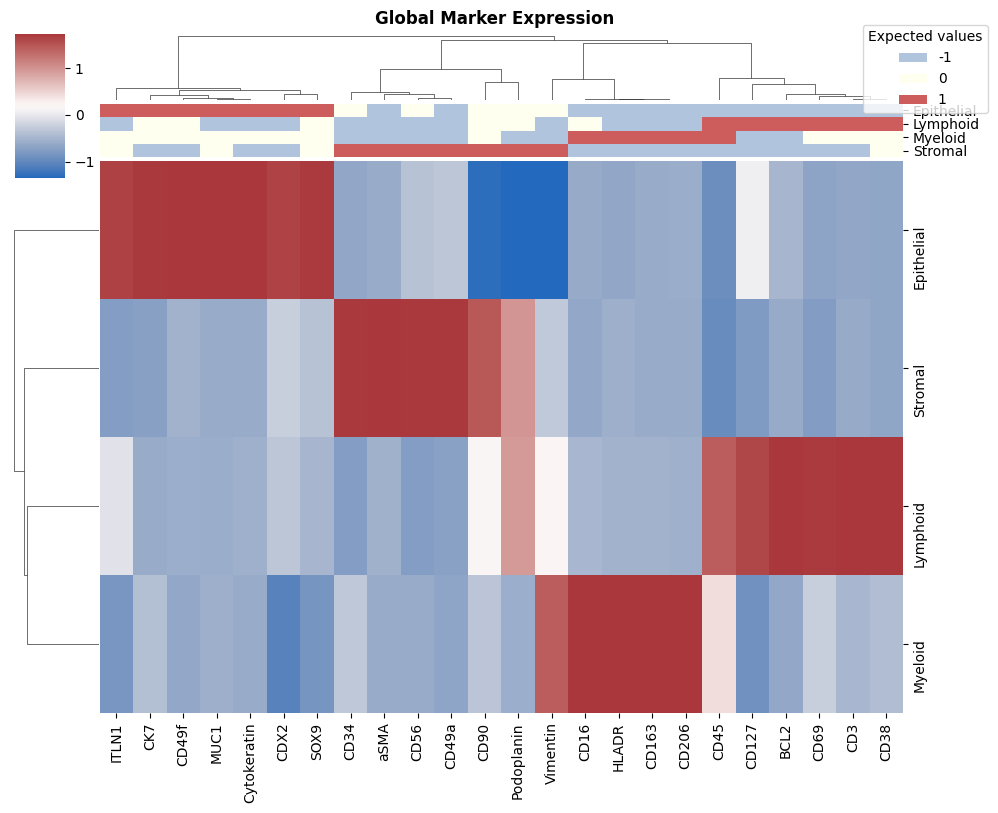

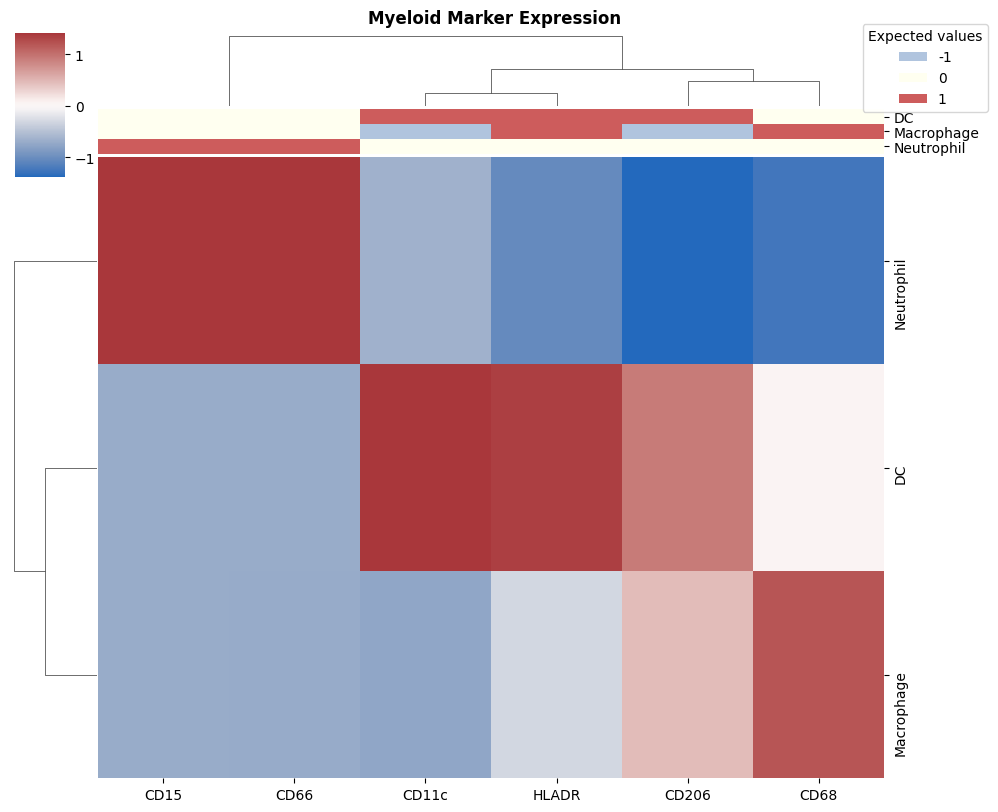

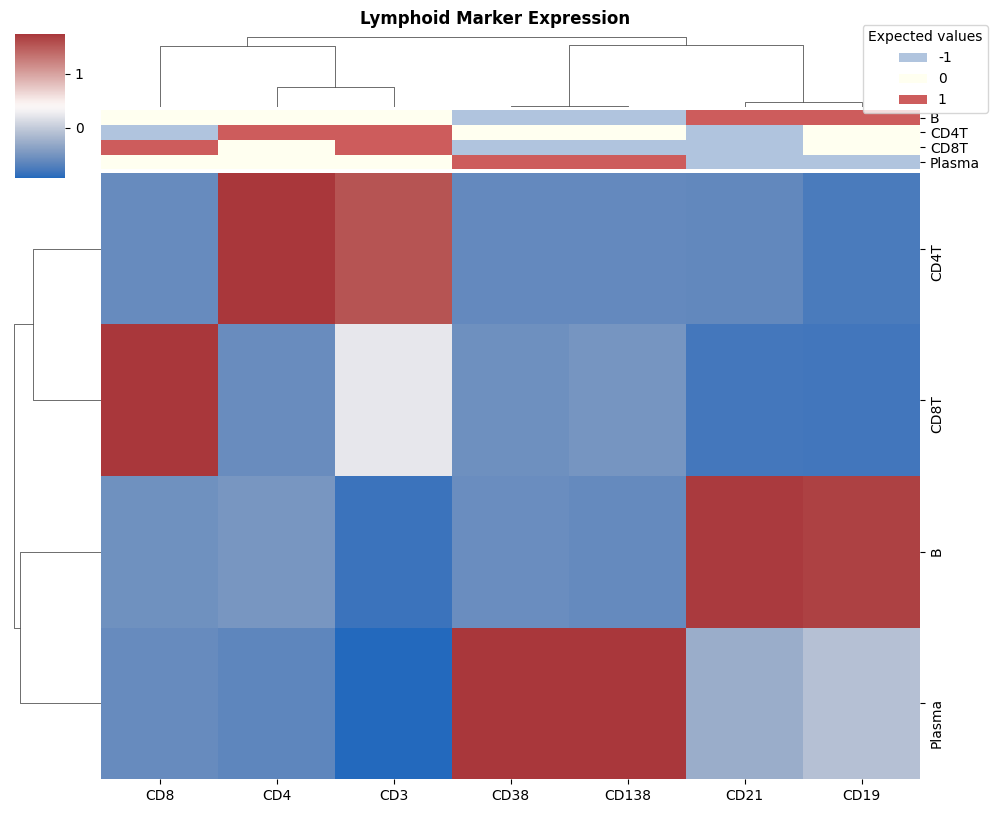

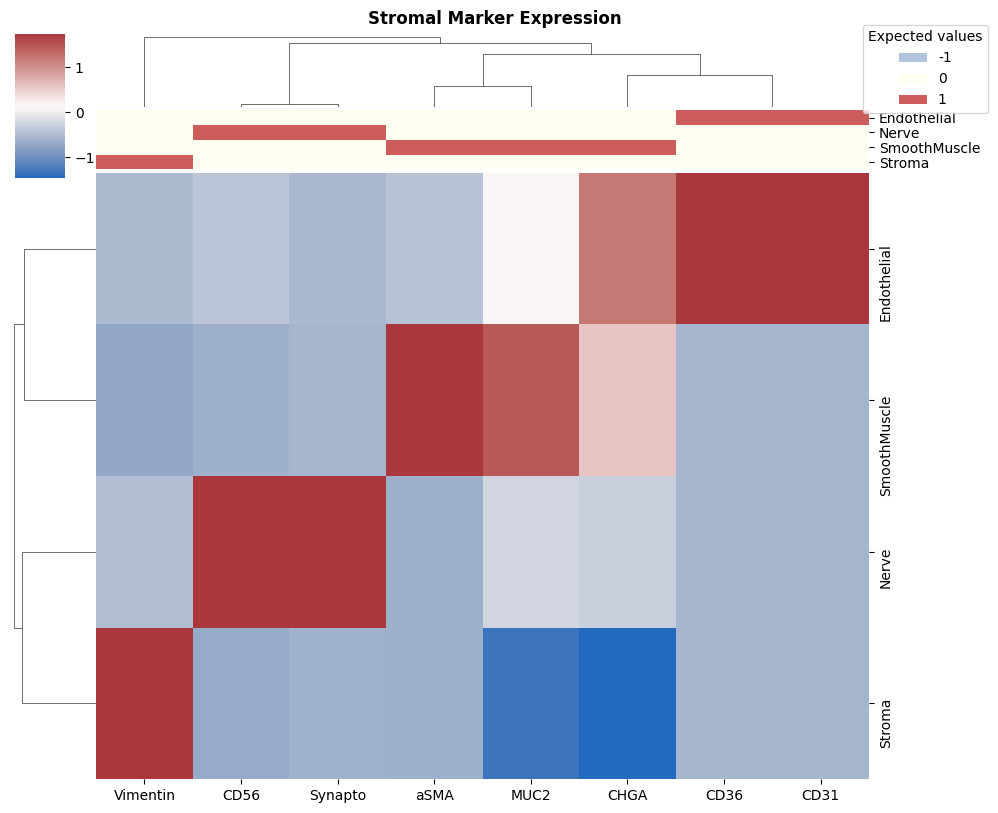

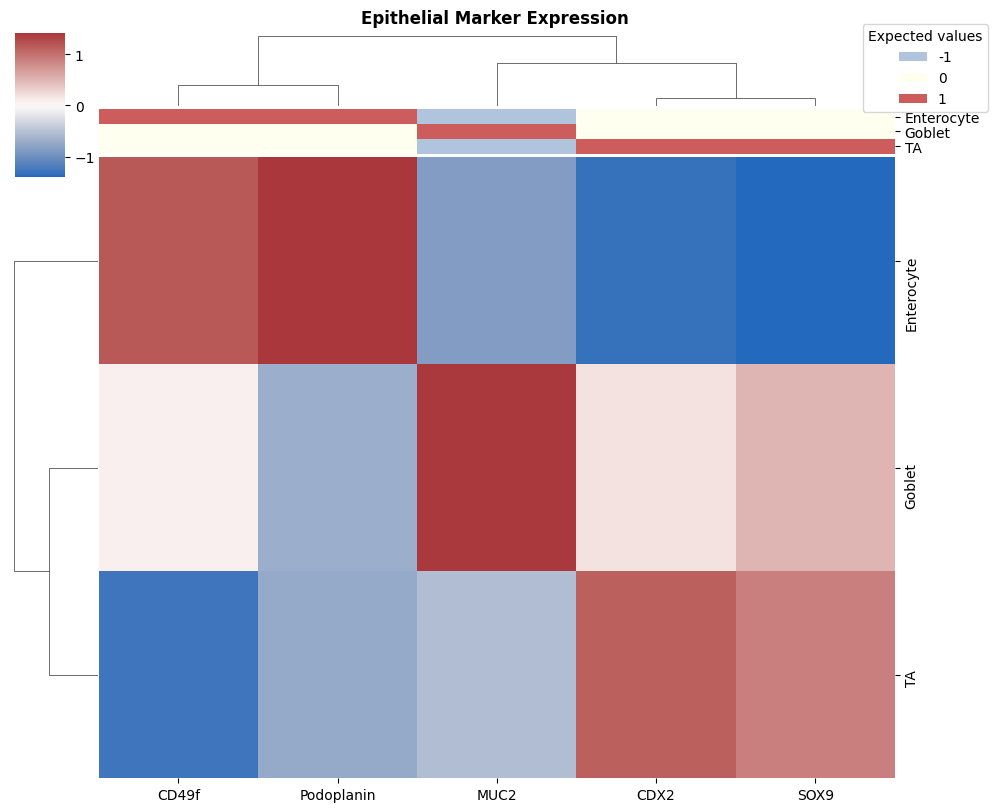

In [155]:
for i in labels.columns.values.tolist()[ : -1]: 
    heatmap_for_median_expression(sample_data, labels, logic, level=i, save=False, fname=None,
                                    dpi='figure', transform=z_score, title="{} Marker Expression".format(i),
                                    c_palette=sns.color_palette(['lightsteelblue', 'ivory', 'indianred'], 3),
                                    cmap_='vlag', dendrogram_ratio_=0.1)

c:\Users\Localadmin_kangzigi\.conda\envs\tribus_new\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Rand score = 0.8702427258572748, Accuracy score = 0.634973290067159, Precision score = 0.6757187362917261, F1 score = 0.6192568515330601


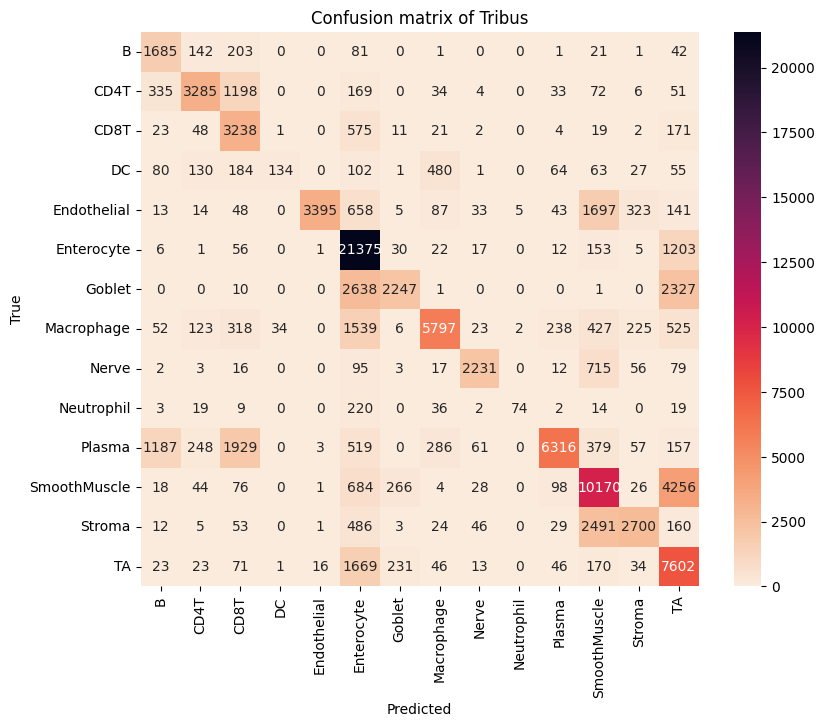

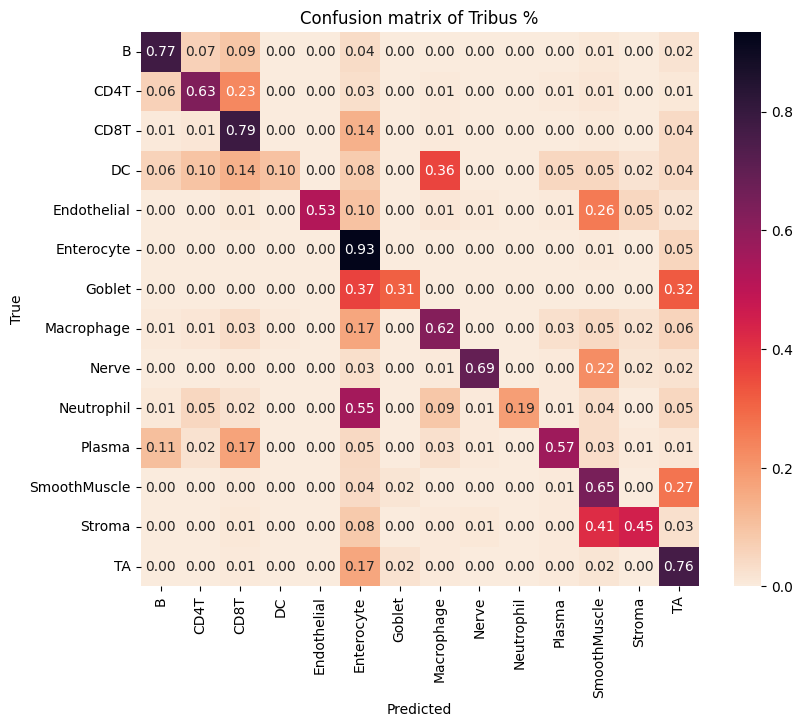

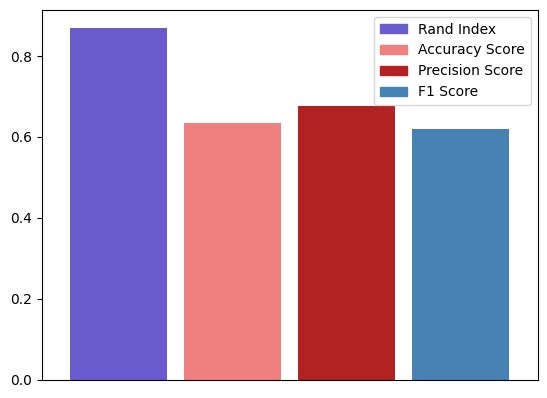

In [156]:
# confusion matrix
if depth == 1: 
    celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
    celltype_pred = np.array(labels["final_label"]).tolist()
    cm_labels = np.intersect1d(np.unique(labels["final_label"]), np.unique(celltype_true))
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.5, len(np.unique(celltype_pred))*0.4))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.5, len(np.unique(celltype_pred))*0.4))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')
else:
    celltype_true = np.array(sample_data["cell_type_A"]).tolist()
    celltype_true = [element.replace('Lymphatic', 'Lympatic') for element in celltype_true]
    celltype_true = [element.replace('CD7_Immune', 'CD7_immune') for element in celltype_true]
    celltype_pred = np.array(labels["final_label"]).tolist()
    cm_labels = np.intersect1d(np.unique(labels["final_label"]), np.unique(celltype_true))
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.5, len(np.unique(celltype_pred))*0.4))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.5, len(np.unique(celltype_pred))*0.4))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')

# Calculate average accuracy metrics and visualization
RI_avg = rand_score(celltype_true, celltype_pred) #between 0-1
AS_avg = accuracy_score(celltype_true, celltype_pred)
PS_avg = precision_score(celltype_true, celltype_pred, average='weighted')
F1_avg = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI_avg, AS_avg, PS_avg, F1_avg))
df = pd.DataFrame([RI_avg, AS_avg, PS_avg, F1_avg], columns=['Value'], index = ["Rand Index", "Accuracy Score", "Precision Score", "F1 Score"])

colors = {"Rand Index": 'slateblue', "Accuracy Score": 'lightcoral', "Precision Score": 'firebrick', "F1 Score":'steelblue'}
df.plot.bar(y='Value', width = 0.85, legend=False, 
            color=['slateblue', 'lightcoral', 'firebrick', 'steelblue'], rot=0, xticks=[])
metric_labels = ["Rand Index", "Accuracy Score", "Precision Score", "F1 Score"]
handles = [plt.Rectangle((0,0),1,1, color=colors[l]) for l in metric_labels]
plt.legend(handles, metric_labels)

In [157]:
from sklearn import metrics
classes = np.intersect1d(np.unique(celltype_pred), np.unique(celltype_true))
print(metrics.classification_report(celltype_true, celltype_pred, labels=classes))

              precision    recall  f1-score   support

           B       0.49      0.77      0.59      2202
        CD4T       0.80      0.62      0.70      5259
        CD8T       0.42      0.78      0.55      4127
          DC       0.79      0.10      0.18      1342
 Endothelial       0.99      0.52      0.68      6504
  Enterocyte       0.66      0.93      0.77     22982
      Goblet       0.80      0.31      0.44      7356
  Macrophage       0.81      0.62      0.70      9372
       Nerve       0.86      0.67      0.75      3329
  Neutrophil       0.91      0.18      0.31       400
      Plasma       0.91      0.55      0.69     11425
SmoothMuscle       0.57      0.65      0.61     15729
      Stroma       0.75      0.45      0.56      6055
          TA       0.44      0.76      0.56     10021

   micro avg       0.64      0.66      0.65    106103
   macro avg       0.73      0.56      0.58    106103
weighted avg       0.70      0.66      0.65    106103



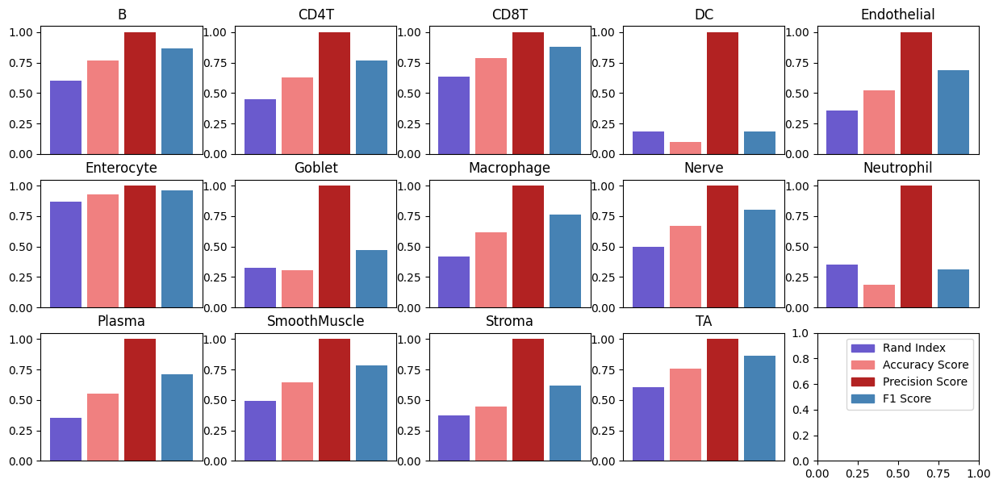

In [158]:
# Incorrect! 
# Calculate average accuracy metrics per cell type predicted
# visualization

class_df = pd.DataFrame([celltype_true, celltype_pred], index=["True", "Predict"]).T

rows = math.ceil(len(np.intersect1d(np.unique(celltype_pred), np.unique(celltype_true))) / 5)
fig, ax = plt.subplots(rows, 5, figsize=(15,7))

for i in range(len(np.intersect1d(np.unique(celltype_pred), np.unique(celltype_true)))): 
    
    celltype = np.intersect1d(np.unique(celltype_pred), np.unique(celltype_true))[i]

    RI = rand_score(class_df["True"].loc[class_df['True'] == celltype], 
                    class_df["Predict"].loc[class_df['True'] == celltype]) #between 0-1
    AS = accuracy_score(class_df["True"].loc[class_df['True'] == celltype], 
                    class_df["Predict"].loc[class_df['True'] == celltype])
    PS = precision_score(class_df["True"].loc[class_df['True'] == celltype], 
                    class_df["Predict"].loc[class_df['True'] == celltype], average='weighted')
    F1 = f1_score(class_df["True"].loc[class_df['True'] == celltype], 
                    class_df["Predict"].loc[class_df['True'] == celltype], average='weighted')
    df = pd.DataFrame([RI, AS, PS, F1], 
                      columns=['Value'], 
                      index = ["Rand Index", "Accuracy Score", "Precision Score", "F1 Score"])
    
    colors = {"Rand Index": 'slateblue', "Accuracy Score": 'lightcoral', "Precision Score": 'firebrick', "F1 Score":'steelblue'}
    df.plot.bar(y='Value', ax=ax[int(i / 5)][i % 5], width = 0.85, 
                title="{}".format(celltype), legend=False, 
                color=['slateblue', 'lightcoral', 'firebrick', 'steelblue'], rot=0, xticks=[])

metric_labels = ["Rand Index", "Accuracy Score", "Precision Score", "F1 Score"]
handles = [plt.Rectangle((0,0),1,1, color=colors[l]) for l in metric_labels]
plt.legend(handles, metric_labels)
plt.show()

C:\Users\Localadmin_kangzigi\AppData\Local\Temp\ipykernel_21868\2707972080.py:46: RuntimeWarning: invalid value encountered in true_divide
  cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
c:\Users\Localadmin_kangzigi\.conda\envs\tribus_new\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Rand score = 0.8702427258572748, Accuracy score = 0.634973290067159, Precision score = 0.6757187362917261, F1 score = 0.6192568515330601


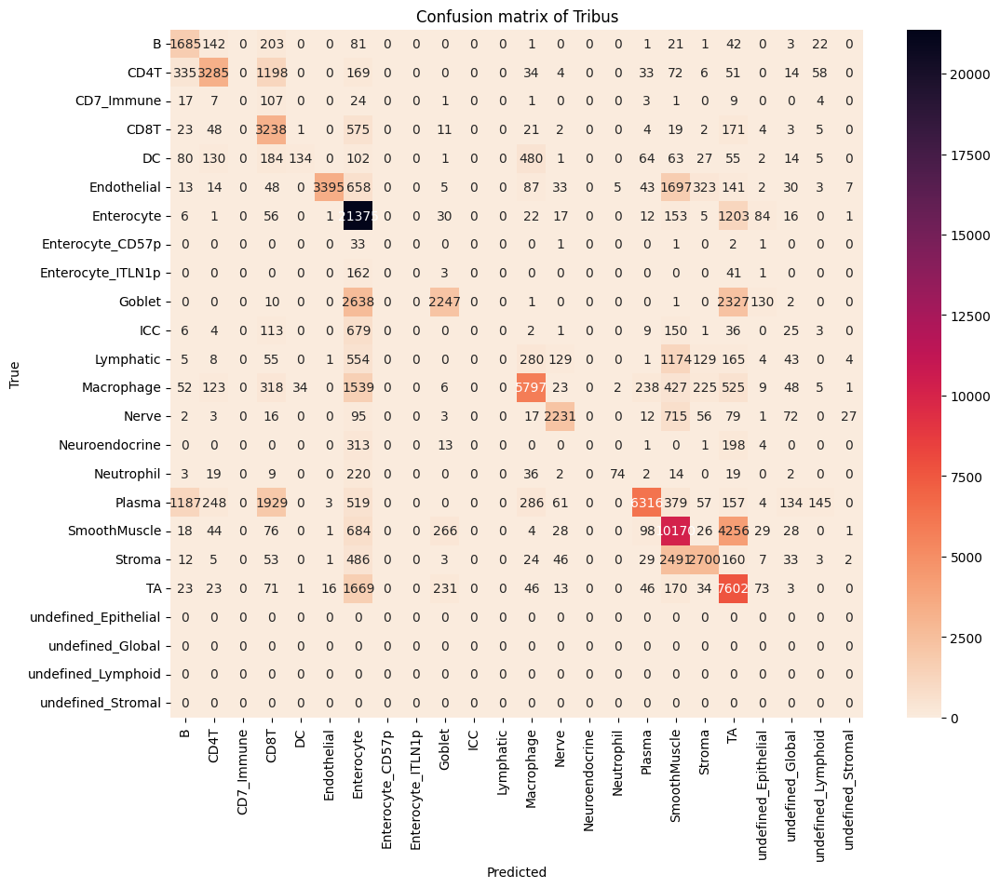

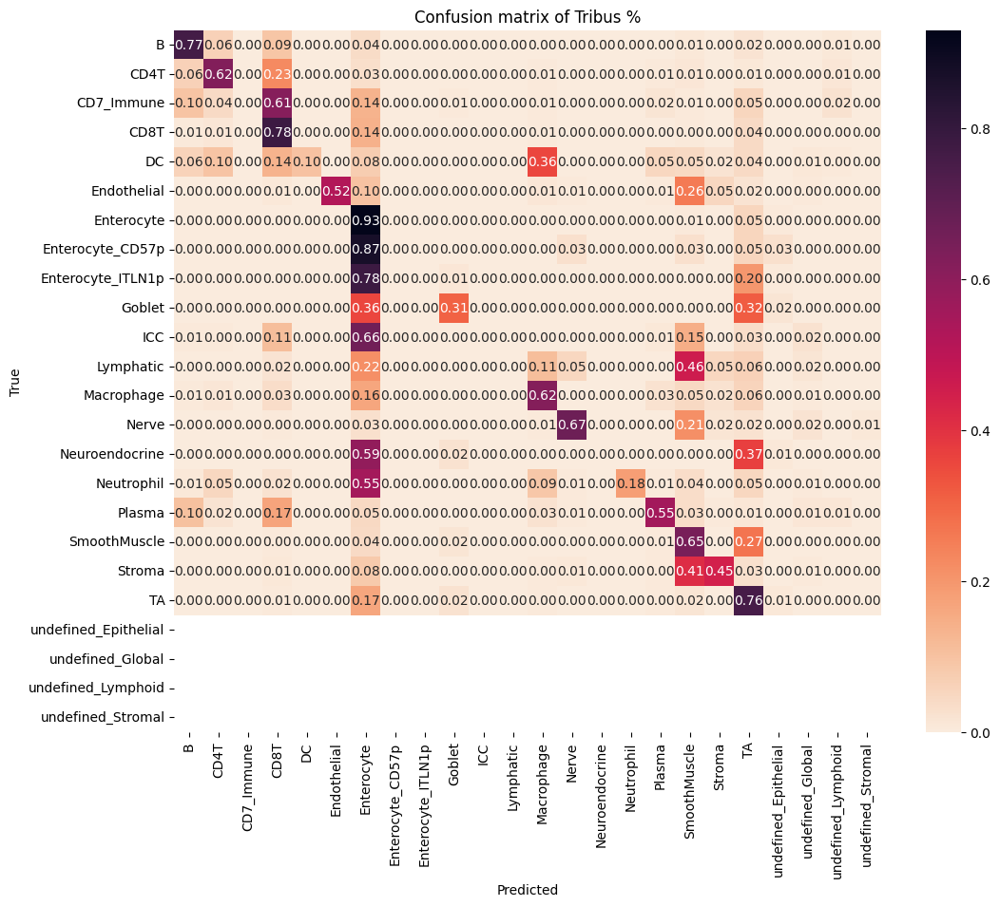

In [159]:
# confusion matrix for all classes
if depth == 1: 
    celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
    celltype_pred = np.array(labels["final_label"]).tolist()
    # cm_labels = np.intersect1d(np.unique(labels["final_label"]), np.unique(celltype_true))
    cm_labels = np.union1d(np.unique(labels["final_label"]), np.unique(celltype_true))
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(cm_labels))*0.5, len(np.unique(cm_labels))*0.4))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(cm_labels))*0.5, len(np.unique(cm_labels))*0.4))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')
else:
    celltype_true = np.array(sample_data["cell_type_A"]).tolist()
    celltype_pred = np.array(labels["final_label"]).tolist()
        # cm_labels = np.intersect1d(np.unique(labels["final_label"]), np.unique(celltype_true))
    cm_labels = np.union1d(np.unique(labels["final_label"]), np.unique(celltype_true))
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(cm_labels))*0.5, len(np.unique(cm_labels))*0.4))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(cm_labels))*0.5, len(np.unique(cm_labels))*0.4))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')

RI = rand_score(celltype_true, celltype_pred) #between 0-1
AS = accuracy_score(celltype_true, celltype_pred)
PS = precision_score(celltype_true, celltype_pred, average='weighted')
F1 = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI, AS, PS, F1))

Rand score = 0.8308182491573773, Adjusted Rand Score = 0.6086559677820174, Accuracy score = 0.8380772463912214, Precision score = 0.858633818853111, F1 score = 0.8360172581311374
              precision    recall  f1-score   support

  Epithelial       0.76      0.98      0.86     41134
    Lymphoid       0.90      0.87      0.89     23187
     Myeloid       0.89      0.59      0.71     11114
     Stromal       0.93      0.73      0.82     35198

   micro avg       0.84      0.84      0.84    110633
   macro avg       0.87      0.79      0.82    110633
weighted avg       0.86      0.84      0.84    110633



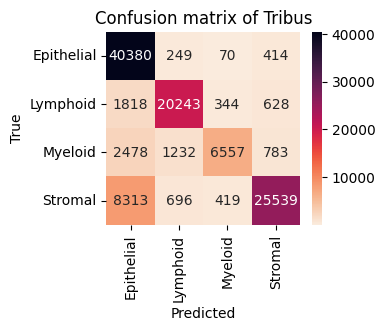

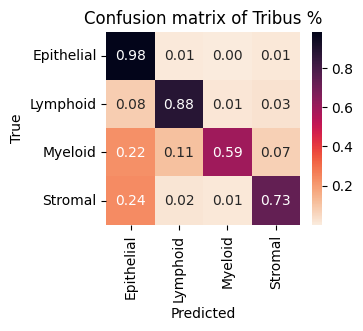

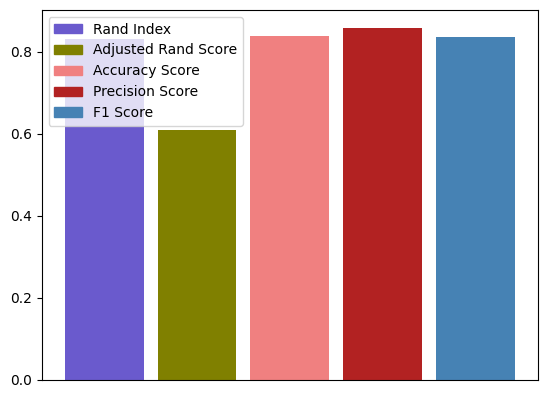

In [160]:
# confusion matrix for first level
celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
celltype_pred = np.array(labels["Global"]).tolist()
cm_labels = np.intersect1d(np.unique(labels["Global"]), np.unique(celltype_true))
cm = confusion_matrix(celltype_true, 
                      celltype_pred, 
                      labels = cm_labels)
                                                       
df_cm = pd.DataFrame(cm, index = cm_labels,
                  columns = cm_labels)
plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
plt.title('Confusion matrix of Tribus')
plt.xlabel('Predicted')
plt.ylabel('True')


cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
df_cmn = pd.DataFrame(cmn, index = cm_labels,
                  columns = cm_labels)
plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
plt.title('Confusion matrix of Tribus %')
plt.xlabel('Predicted')
plt.ylabel('True')

# Calculate average accuracy metrics and visualization
RI_avg = rand_score(celltype_true, celltype_pred) #between 0-1
adj_RI_avg = adjusted_rand_score(celltype_true, celltype_pred)
AS_avg = accuracy_score(celltype_true, celltype_pred)
PS_avg = precision_score(celltype_true, celltype_pred, average='weighted')
F1_avg = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Adjusted Rand Score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI_avg, adj_RI_avg, AS_avg, PS_avg, F1_avg))
df = pd.DataFrame([RI_avg, adj_RI_avg, AS_avg, PS_avg, F1_avg], 
                  columns=['Value'], 
                  index = ["Rand Index", "Adjusted Rand Score", "Accuracy Score", "Precision Score", "F1 Score"])

colors = {"Rand Index": 'slateblue', 
          "Adjusted Rand Score" : "olive", 
          "Accuracy Score": 'lightcoral', 
          "Precision Score": 'firebrick', 
          "F1 Score":'steelblue'}

df.plot.bar(y='Value', width = 0.85, legend=False, 
            color=['slateblue', "olive", 'lightcoral', 'firebrick', 'steelblue'], rot=0, xticks=[])
metric_labels = ["Rand Index", "Adjusted Rand Score", "Accuracy Score", "Precision Score", "F1 Score"]
handles = [plt.Rectangle((0,0),1,1, color=colors[l]) for l in metric_labels]
plt.legend(handles, metric_labels)

from sklearn import metrics
classes = np.intersect1d(np.unique(celltype_pred), np.unique(celltype_true))
print(metrics.classification_report(celltype_true, celltype_pred, labels=classes))

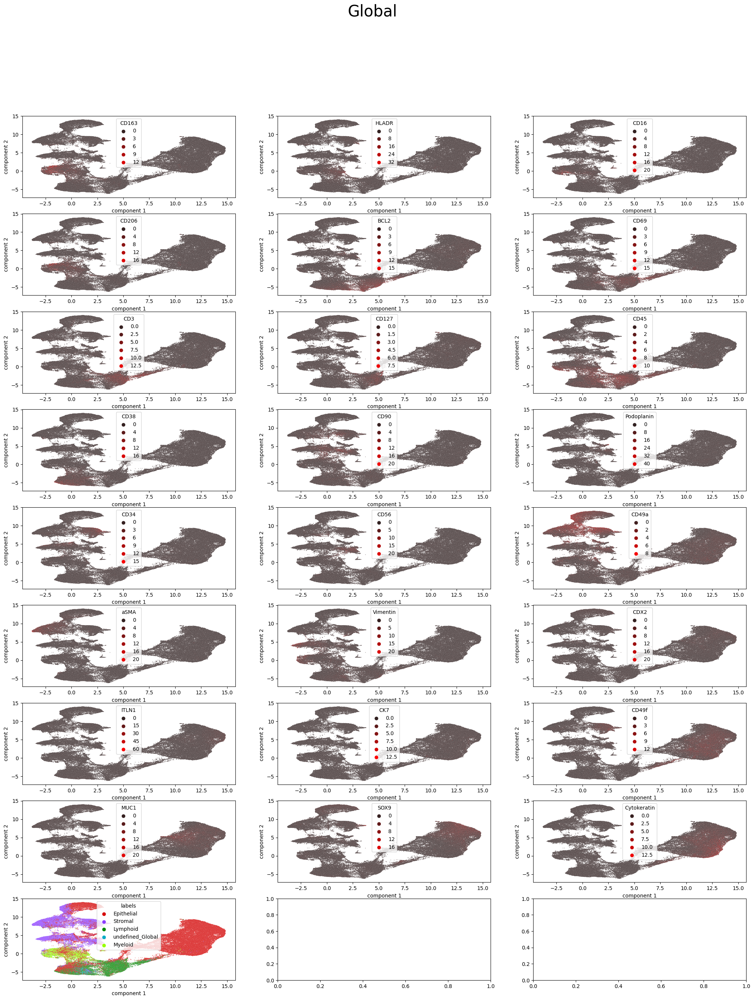

In [138]:
umap_vis(sample_data, labels, markers=logic["Global"].index.values.tolist(), save=False, fname=None,  level="Global", title=None, init='spectral',
             random_state=0, n_neighbors=10, min_dist=0.1, metric='correlation', palette_markers='mycolormap',
             palette_cell='tab10', dpi='figure')

### Check the stability of Tribus analysis

Global, subsetting done
Myeloid, subsetting done
Lymphoid, subsetting done
Stromal, subsetting done
Epithelial, subsetting done
4.263960087299347 minutes


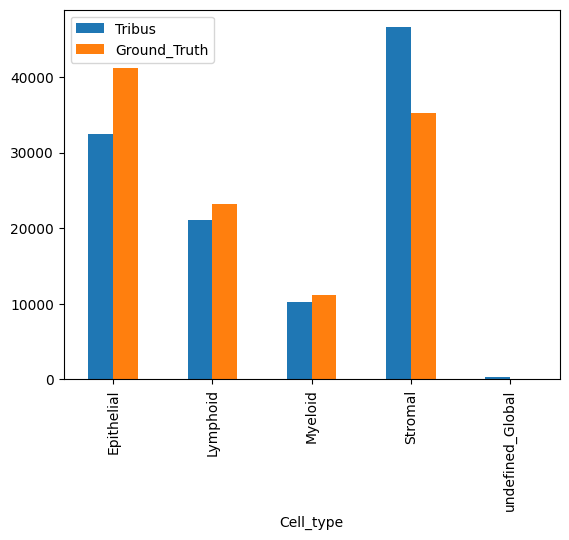

Global, subsetting done
Myeloid, subsetting done
Lymphoid, subsetting done
Stromal, subsetting done
Epithelial, subsetting done
4.327396313349406 minutes


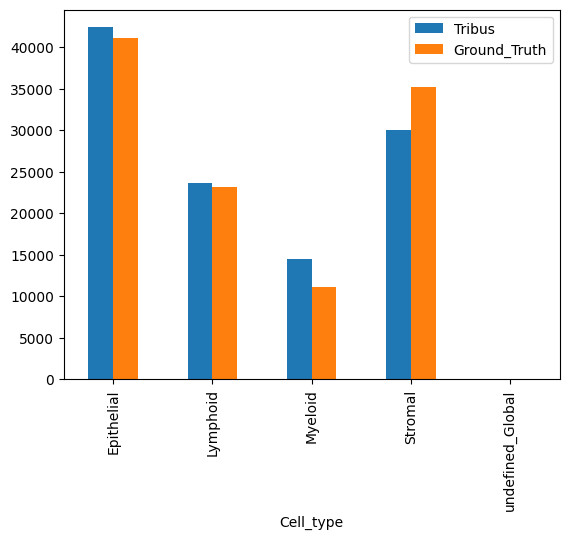

Global, subsetting done
Myeloid, subsetting done
Lymphoid, subsetting done
Stromal, subsetting done
Epithelial, subsetting done
4.339564764499665 minutes


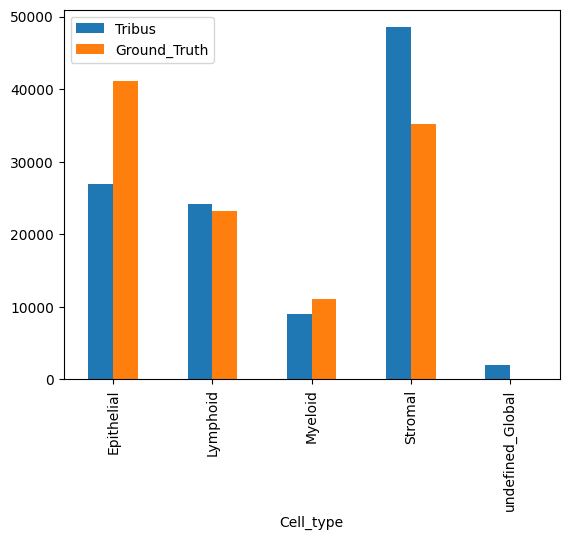

Global, subsetting done
Myeloid, subsetting done
Lymphoid, subsetting done
Stromal, subsetting done
Epithelial, subsetting done
4.147093037764232 minutes


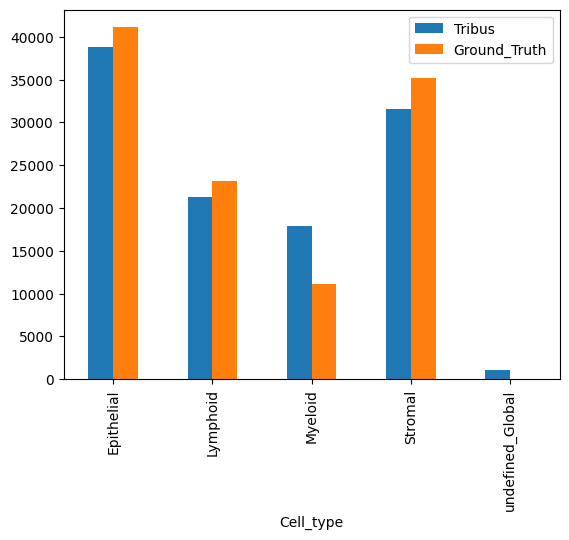

Global, subsetting done
Myeloid, subsetting done
Lymphoid, subsetting done
Stromal, subsetting done
Epithelial, subsetting done
4.226480344931285 minutes


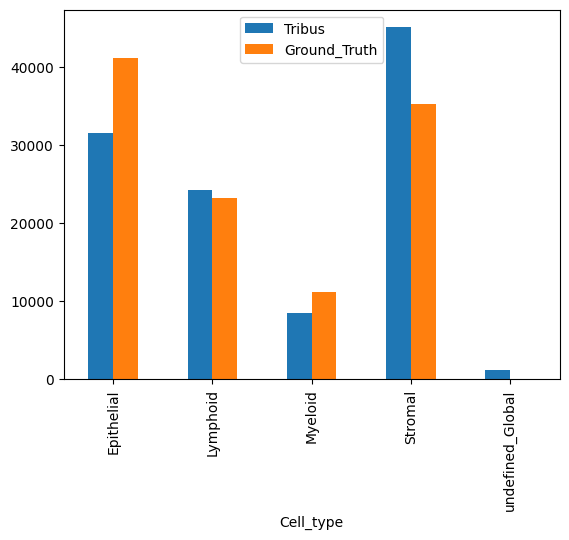

In [15]:
labels_list = []
for i in range(5):
    labels, scores = run_tribus(sample_data, logic, 2)
    labels_list.append(labels)
    # labels.to_csv(f"labels_{i}.csv")

    # cell_type_distribution(labels, level="Global")
    Tribus_stat = pd.DataFrame(np.array(np.unique(list(labels["Global"]), return_counts=True)).T, columns=("Cell_type", "Tribus"))
    Truth_stat = pd.DataFrame(np.array(np.unique(list(sample_data["cell_type_upperlevel"]), return_counts=True)).T, columns=("Cell_type", "Ground_Truth"))
    Stat_merged = pd.merge(Tribus_stat, Truth_stat, how="outer", on=["Cell_type"])
    Stat_merged["Tribus"] = pd.to_numeric(Stat_merged["Tribus"])
    Stat_merged["Ground_Truth"] = pd.to_numeric(Stat_merged["Ground_Truth"])

    Stat_merged.plot(x="Cell_type",
        kind='bar',
        stacked=False)
    plt.show()

In [13]:
labels_list_new = []
for i in range(len(labels_list)):
    new = list(labels_list[i]["Global"])
    labels_list_new.append(new)

In [14]:
# calculate the intersection between all samples
counts = 0
for i in range(len(labels_list_new[0])):
    if labels_list_new[0][i] == labels_list_new[1][i] and labels_list_new[0][i] == labels_list_new[3][i] and labels_list_new[0][i] == labels_list_new[4][i] and labels_list_new[0][i] == labels_list_new[5][i] and labels_list_new[0][i] == labels_list_new[6][i] and labels_list_new[0][i] == labels_list_new[7][i] and labels_list_new[0][i] == labels_list_new[8][i] and labels_list_new[0][i] == labels_list_new[9][i]:
        counts += 1
counts/len(labels_list_new[0])

0.5422703894859581

In [15]:
# calculate the intersection between 2 samples
counts = 0
for i in range(len(labels_list_new[0])):
    if labels_list_new[3][i] == labels_list_new[9][i]:
        counts += 1
counts/len(labels_list_new[0])

0.7506801768007737

## Analysis on B004 Small Bowel region

### Run Tribus

In [141]:
# read input files
sample_data = pd.read_csv('C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\input_data\\STELLAR_data_donor_004_upperlevel_SB.csv',low_memory=False)
df = pd.ExcelFile("C:\\Users\\Public\\Farkkila_lab_datasets\\Tribus\\Test_case_data\\STELLAR\\stellar_logic_gate_cl_updated.xlsx")
logic = pd.read_excel(df, df.sheet_names, index_col=0)

<Axes: >

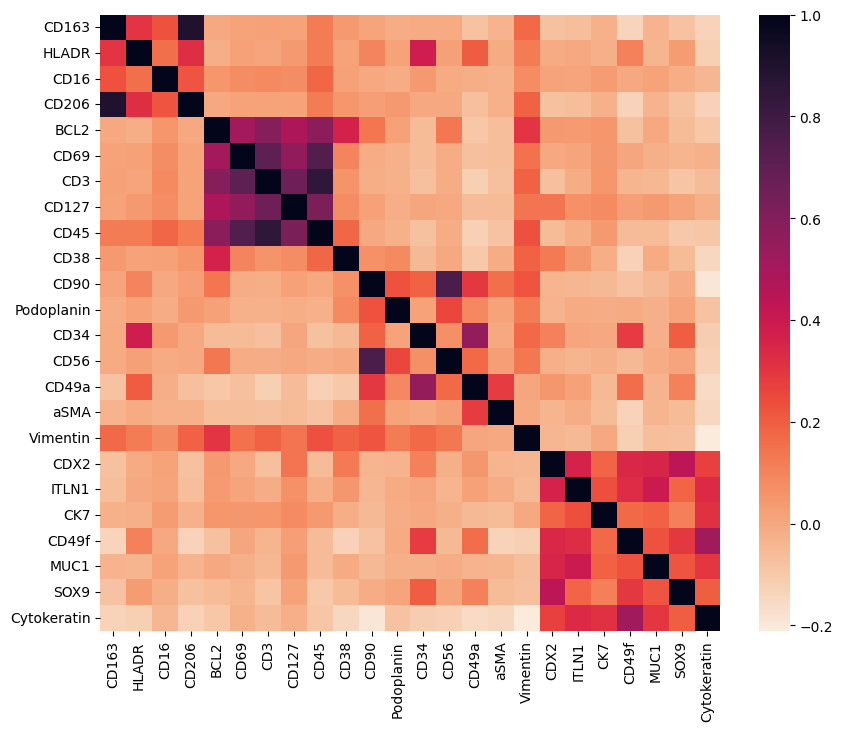

In [142]:
# check the marker correlation matrix we choose for the clustering method
marker_df = sample_data[logic["Global"]["Epithelial"].index]
plt.figure(figsize=(10,8))
sns.heatmap(marker_df.corr(),cmap=sns.cm.rocket_r)

In [147]:
# Run Tribus on z-scored dataset
depth = 2
labels, scores = run_tribus(sample_data, logic, depth=depth, normalization=z_score) # modify depth

Global, subsetting done
Myeloid, subsetting done
Lymphoid, subsetting done
Stromal, subsetting done
Epithelial, subsetting done
6.4894896149635315 minutes


### Check Tribus Result

<Axes: xlabel='Cell_type'>

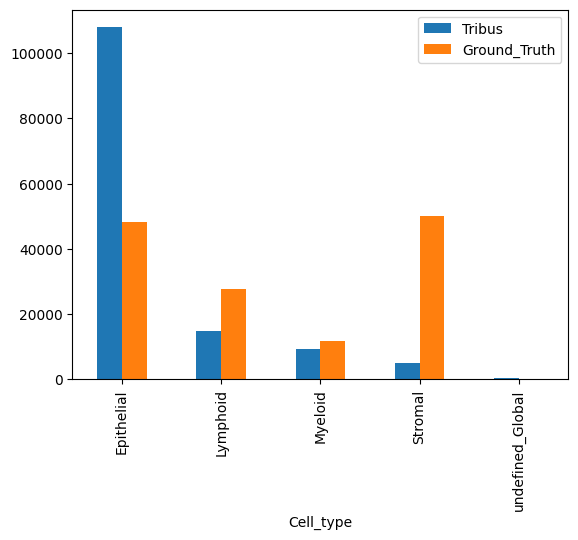

In [148]:
# cell_type_distribution(labels, level="Global")
Tribus_stat = pd.DataFrame(np.array(np.unique(list(labels["Global"]), return_counts=True)).T, columns=("Cell_type", "Tribus"))
Truth_stat = pd.DataFrame(np.array(np.unique(list(sample_data["cell_type_upperlevel"]), return_counts=True)).T, columns=("Cell_type", "Ground_Truth"))
Stat_merged = pd.merge(Tribus_stat, Truth_stat, how="outer", on=["Cell_type"])
Stat_merged["Tribus"] = pd.to_numeric(Stat_merged["Tribus"])
Stat_merged["Ground_Truth"] = pd.to_numeric(Stat_merged["Ground_Truth"])

Stat_merged.plot(x="Cell_type",
        kind='bar',
        stacked=False)

<Axes: xlabel='Cell_type'>

<Figure size 2000x600 with 0 Axes>

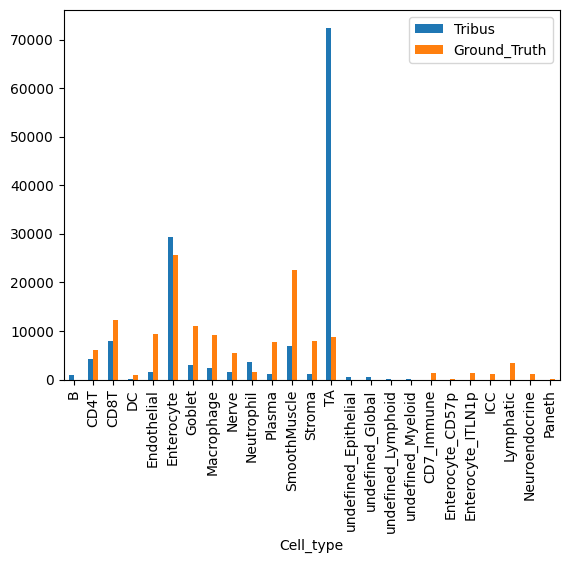

In [145]:
Tribus_stat = pd.DataFrame(np.array(np.unique(list(labels["final_label"]), return_counts=True)).T, columns=("Cell_type", "Tribus"))
Truth_stat = pd.DataFrame(np.array(np.unique(list(sample_data["cell_type_A"]), return_counts=True)).T, columns=("Cell_type", "Ground_Truth"))
Stat_merged = pd.merge(Tribus_stat, Truth_stat, how="outer", on=["Cell_type"])
Stat_merged["Tribus"] = pd.to_numeric(Stat_merged["Tribus"])
Stat_merged["Ground_Truth"] = pd.to_numeric(Stat_merged["Ground_Truth"])

plt.figure(figsize=(20,6))
Stat_merged.plot(x="Cell_type",
        kind='bar',
        stacked=False)

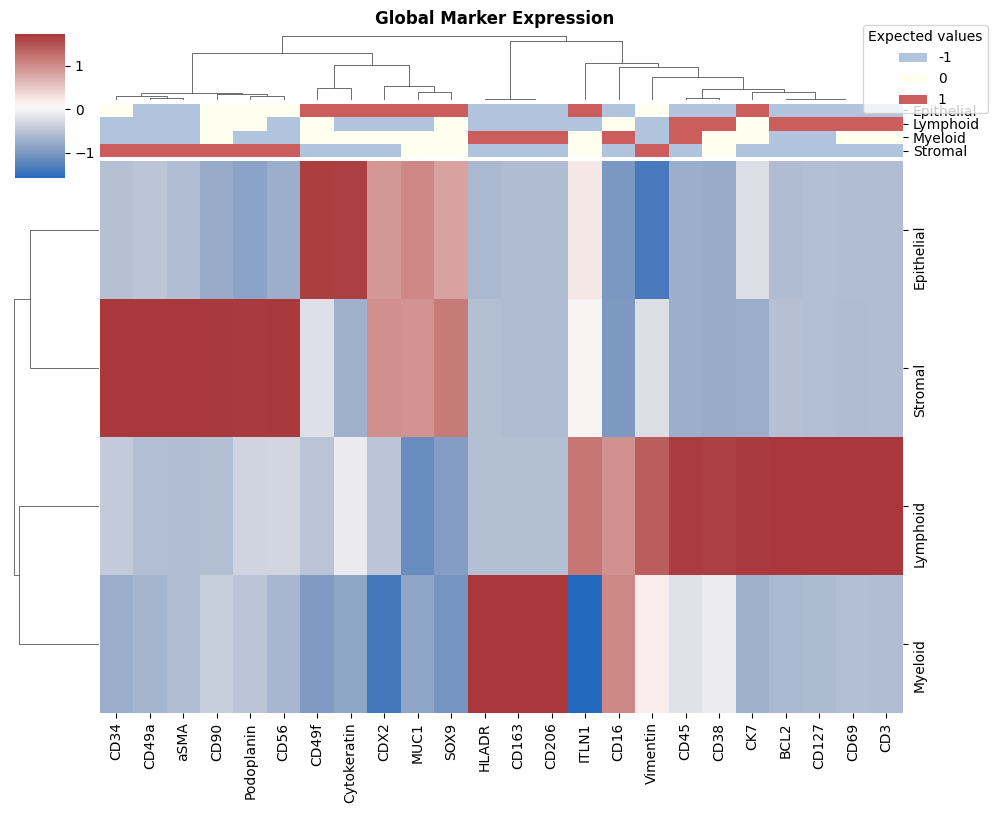

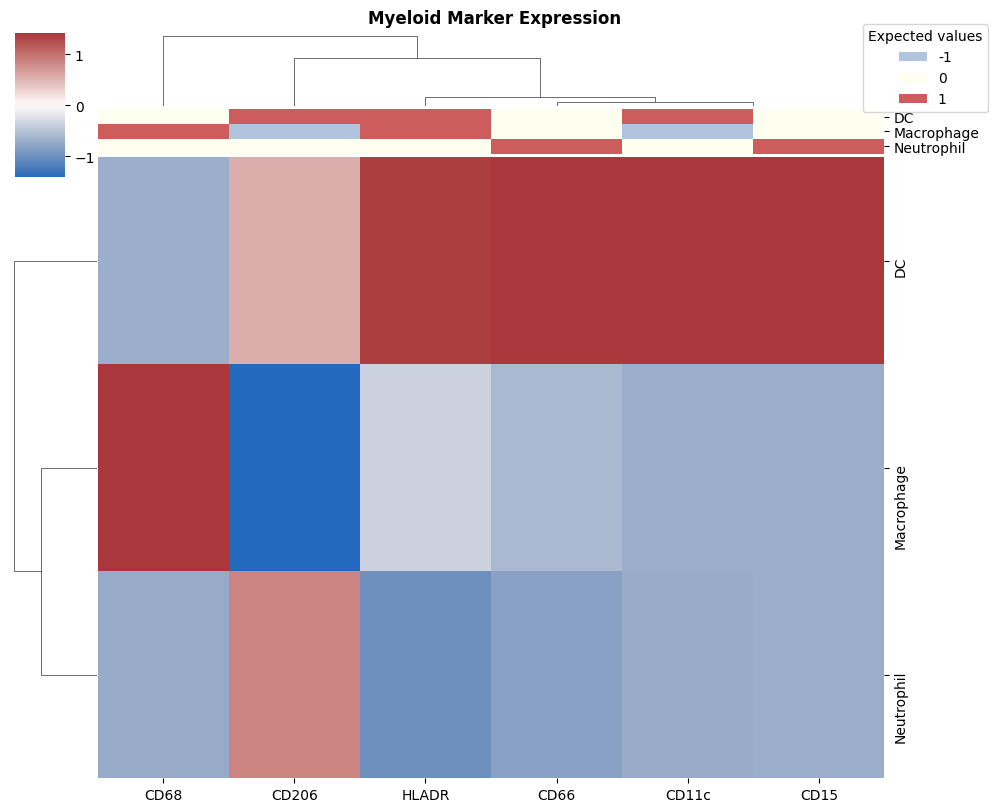

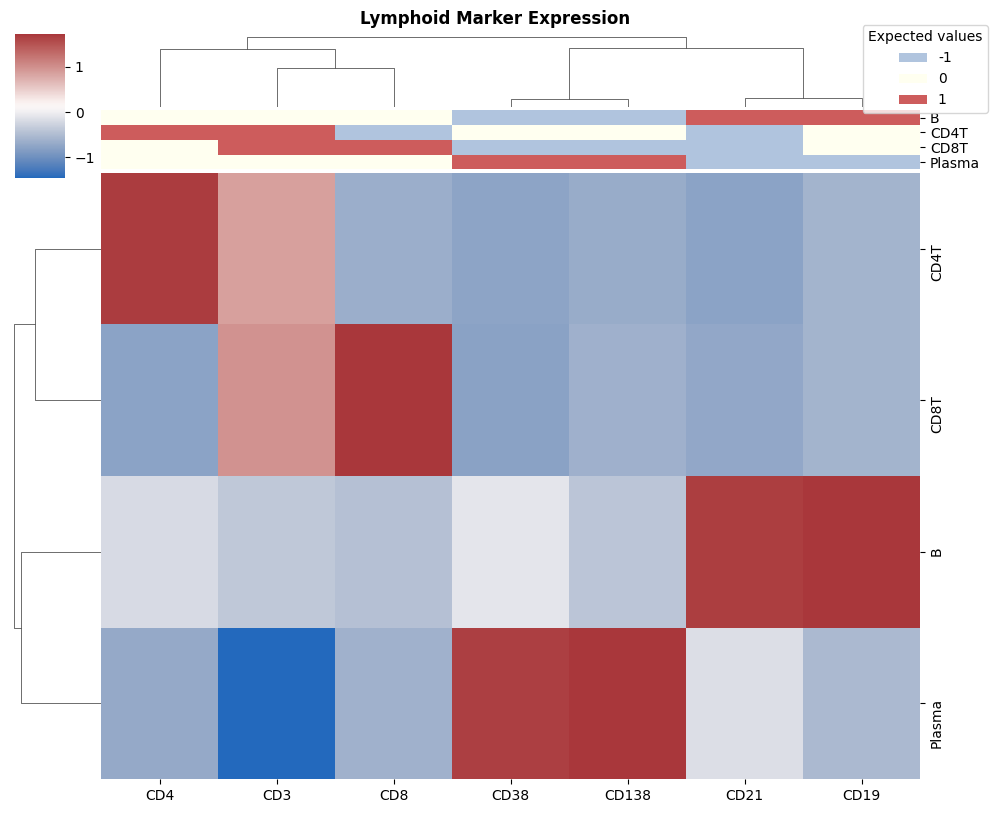

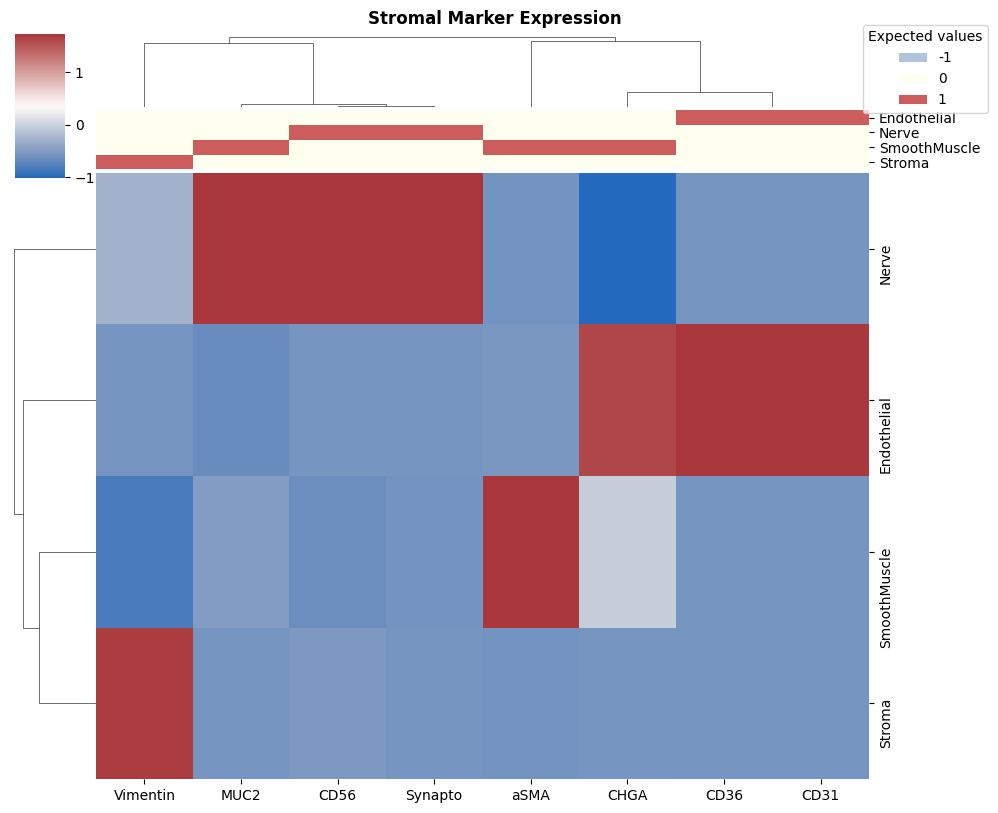

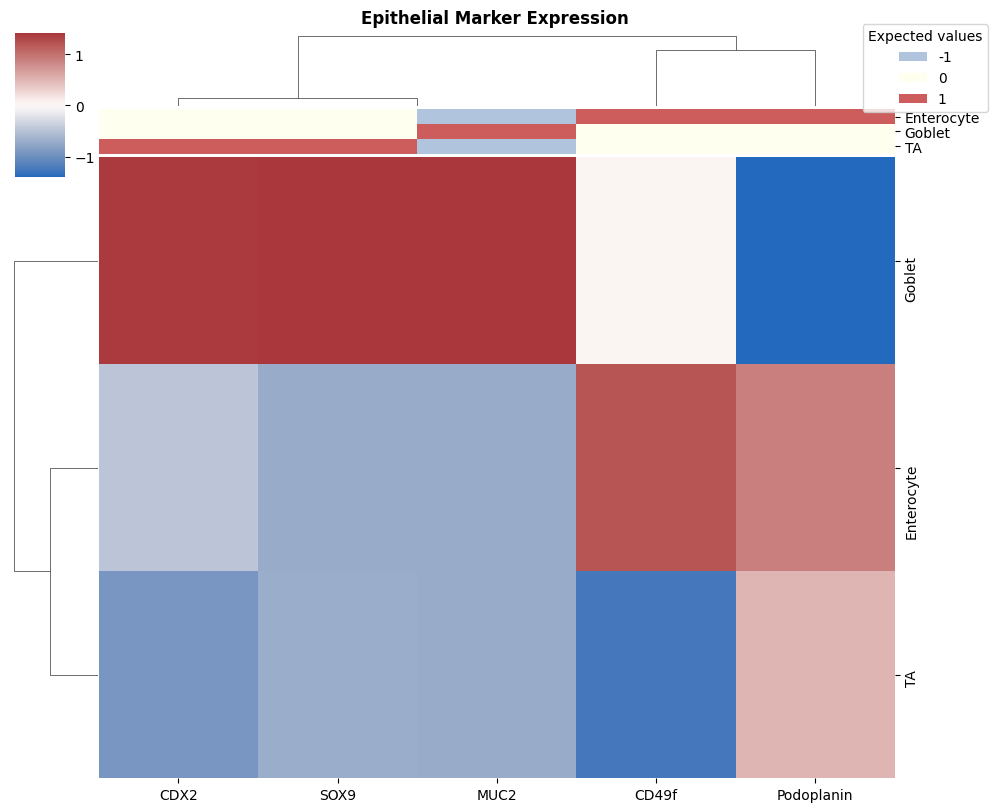

In [146]:
for i in labels.columns.values.tolist()[ : -1]: 
    heatmap_for_median_expression(sample_data, labels, logic, level=i, save=False, fname=None,
                                    dpi='figure', transform=z_score, title="{} Marker Expression".format(i),
                                    c_palette=sns.color_palette(['lightsteelblue', 'ivory', 'indianred'], 3),
                                    cmap_='vlag', dendrogram_ratio_=0.1)

c:\Users\Localadmin_kangzigi\.conda\envs\tribus_new\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Rand score = 0.6789074095479983, Accuracy score = 0.4825792578386075, Precision score = 0.6412503644478501, F1 score = 0.46147100136185987


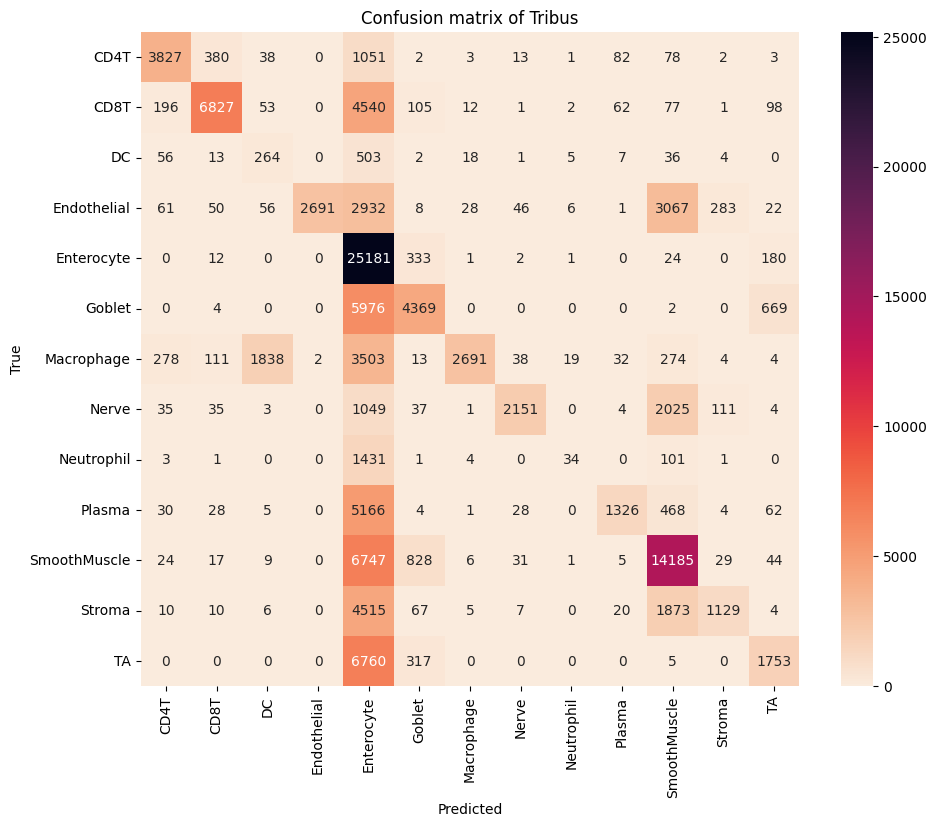

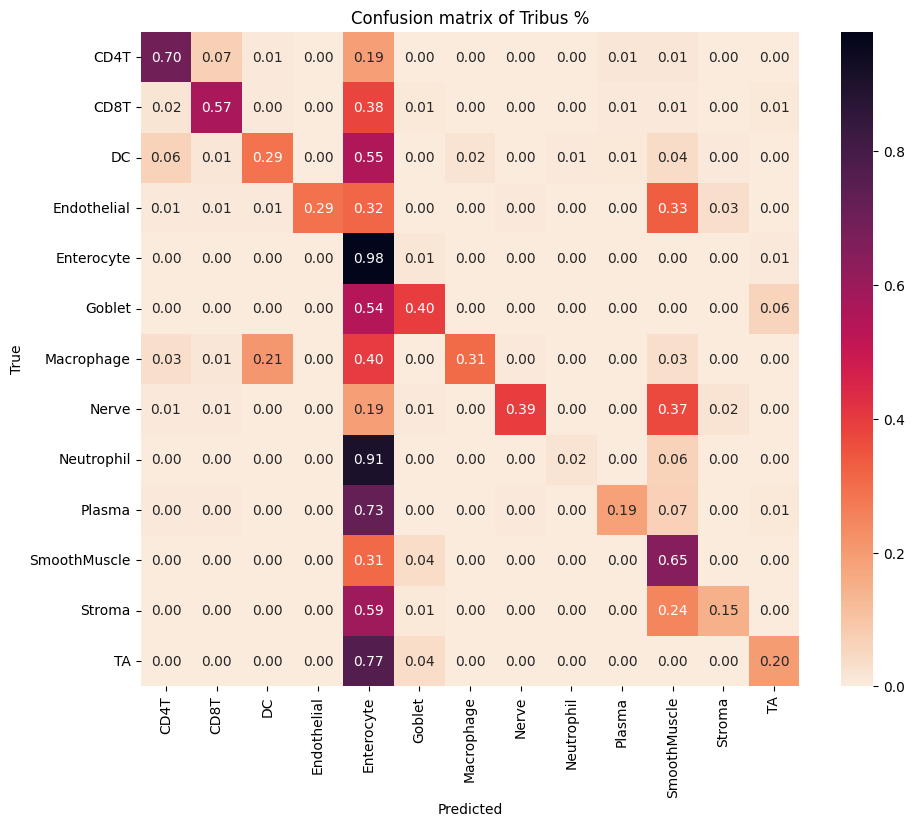

In [19]:
# confusion matrix
if depth == 1: 
    celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
    celltype_pred = np.array(labels["final_label"]).tolist()
    cm_labels = np.intersect1d(np.unique(labels["final_label"]), np.unique(celltype_true))
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')
else:
    celltype_true = np.array(sample_data["cell_type_A"]).tolist()
    celltype_true = [element.replace('Lymphatic', 'Lympatic') for element in celltype_true]
    celltype_true = [element.replace('CD7_Immune', 'CD7_immune') for element in celltype_true]
    celltype_pred = np.array(labels["final_label"]).tolist()
    cm_labels = np.intersect1d(np.unique(labels["final_label"]), np.unique(celltype_true))
    cm = confusion_matrix(celltype_true, 
                        celltype_pred, 
                        labels = cm_labels)
                                                        
    df_cm = pd.DataFrame(cm, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus')
    plt.xlabel('Predicted')
    plt.ylabel('True')


    cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    df_cmn = pd.DataFrame(cmn, index = cm_labels,
                    columns = cm_labels)
    plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
    sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
    plt.title('Confusion matrix of Tribus %')
    plt.xlabel('Predicted')
    plt.ylabel('True')

RI = rand_score(celltype_true, celltype_pred) #between 0-1
AS = accuracy_score(celltype_true, celltype_pred)
PS = precision_score(celltype_true, celltype_pred, average='weighted')
F1 = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI, AS, PS, F1))

Rand score = 0.6635294886796198, Accuracy score = 0.6969895097782814, Precision score = 0.8127047439326548, F1 score = 0.6948689495895457


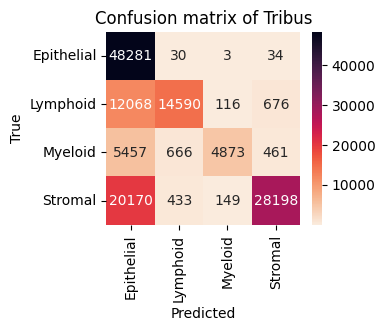

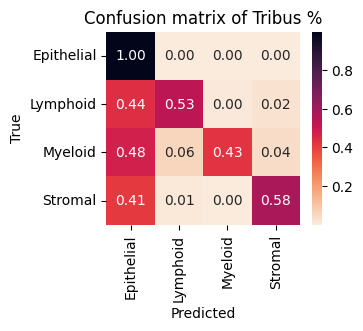

In [20]:
# confusion matrix for first level
celltype_true = np.array(sample_data["cell_type_upperlevel"]).tolist()
celltype_pred = np.array(labels["Global"]).tolist()
cm_labels = np.intersect1d(np.unique(labels["Global"]), np.unique(celltype_true))
cm = confusion_matrix(celltype_true, 
                      celltype_pred, 
                      labels = cm_labels)
                                                       
df_cm = pd.DataFrame(cm, index = cm_labels,
                  columns = cm_labels)
plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
sns.heatmap(df_cm, fmt='g', annot=True, cmap=sns.cm.rocket_r)
plt.title('Confusion matrix of Tribus')
plt.xlabel('Predicted')
plt.ylabel('True')


cmn = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
df_cmn = pd.DataFrame(cmn, index = cm_labels,
                  columns = cm_labels)
plt.figure(figsize = (len(np.unique(celltype_pred))*0.625, len(np.unique(celltype_pred))*0.5))
sns.heatmap(df_cmn, fmt='.2f', annot=True, cmap=sns.cm.rocket_r)
plt.title('Confusion matrix of Tribus %')
plt.xlabel('Predicted')
plt.ylabel('True')

RI = rand_score(celltype_true, celltype_pred) #between 0-1
AS = accuracy_score(celltype_true, celltype_pred)
PS = precision_score(celltype_true, celltype_pred, average='weighted')
F1 = f1_score(celltype_true, celltype_pred, average="weighted")
print("Rand score = {}, Accuracy score = {}, Precision score = {}, F1 score = {}".format(RI, AS, PS, F1))

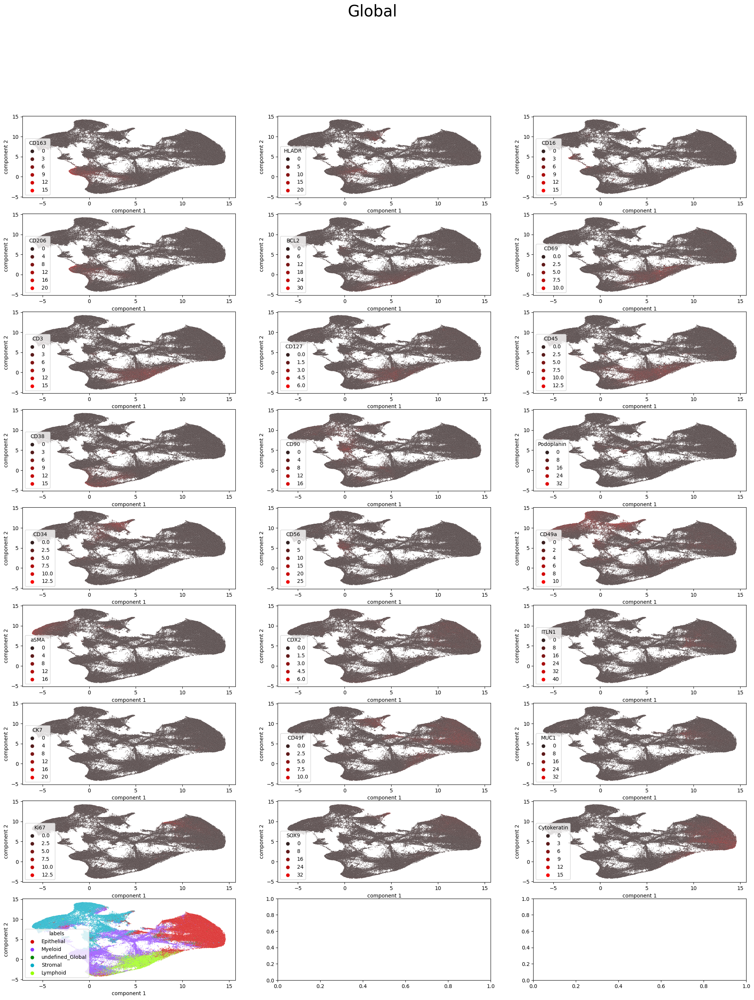

In [21]:
umap_vis(sample_data, labels, markers=logic["Global"].index.values.tolist(), save=False, fname=None,  level="Global", title=None, init='spectral',
             random_state=0, n_neighbors=10, min_dist=0.1, metric='correlation', palette_markers='mycolormap',
             palette_cell='tab10', dpi='figure')